<a href="https://colab.research.google.com/github/LauraPrieto0124/Colombia_EKC_estimation/blob/main/ln_PM2_5_ESDA_in_phyton.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploratory Data Analisys (ESDA) for ln_MP2.5 concentration in Colombia between 2016 - 2022

# Setup

In [ ]:
# Adding necessary libraries to Google Colab environment

# Installing the 'contextily' library for adding basemaps to plots
!pip install contextily -q

# Installing the 'splot' library for spatial data visualization
!pip install splot -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 47.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.0/142.0 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.9/389.9 kB 35.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.9/322.9 kB 29.6 MB/s eta 0:00:00


In [ ]:
# Importing necessary libraries for data analysis and visualization
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import matplotlib.image as mpimg  # Importing matplotlib image for image plotting
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

# Importing libraries for spatial data and visualization
import geopandas as gpd
import folium
from folium import Figure

import contextily as cx

import libpysal
from libpysal  import weights
from libpysal.weights import Queen

# Exploratory Spatial Data Analysis (ESDA) tools
import mapclassify as mc
import esda
from esda.moran import Moran, Moran_Local

# Spatial plotting tools
import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster, plot_local_autocorrelation
from splot.libpysal import plot_spatial_weights
from splot.mapping import vba_choropleth

# Statistical modeling
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Suppressing warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# Import data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Define the URL where the GeoJSON data is located
gdf = gpd.read_file("/content/drive/MyDrive/Earthengine/BBDD/GeoJSON_MP25_2016_2022.geojson")

In [ ]:
gdf.head(3)

,ADM2_CODE,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,ADM2_NAME,Shape_Area,Shape_Leng,2016,2017,2018,2019,2020,2021,2022,ID,geometry
0,13333,57,Colombia,934,Amazonas,El Encanto,0.880306810873,7.97098609968,6.494019413204314,6.711721903995237,7.0351896409950845,5.855572552064537,5.556749286952656,5.461822924508663,6.828982349850428,Amazonas_El Encanto,"POLYGON ((-74.39066 -0.59288, -74.38841 -0.601..."
1,13334,57,Colombia,934,Amazonas,La Chorrera,1.80675895017,7.25362865525,6.5365655156367986,6.367585836246434,6.602226578203584,5.703246918755068,5.262504594029465,5.156294115412039,6.337690607087084,Amazonas_La Chorrera,"POLYGON ((-72.62549 -2.42766, -72.62325 -2.423..."
2,13335,57,Colombia,934,Amazonas,La Pedrera,1.9611389611,9.74190609128,6.496319499240682,5.966264320189016,6.052429848444638,5.503512765174166,4.977001429599789,4.797858966888844,5.760720153076429,Amazonas_La Pedrera,"MULTIPOLYGON (((-69.42529 -1.06898, -69.42305 ..."


In [ ]:
new_column_names = {
    '2016': 'PM2.5_2016',
    '2017': 'PM2.5_2017',
    '2018': 'PM2.5_2018',
    "2019": "PM2.5_2019",
    "2020": "PM2.5_2020",
    "2021": "PM2.5_2021",
    "2022": "PM2.5_2022"
}

gdf = gdf.rename(columns=new_column_names)

gdf.head(3)

,ADM2_CODE,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,ADM2_NAME,Shape_Area,Shape_Leng,PM2.5_2016,PM2.5_2017,PM2.5_2018,PM2.5_2019,PM2.5_2020,PM2.5_2021,PM2.5_2022,ID,geometry
0,13333,57,Colombia,934,Amazonas,El Encanto,0.880306810873,7.97098609968,6.494019413204314,6.711721903995237,7.0351896409950845,5.855572552064537,5.556749286952656,5.461822924508663,6.828982349850428,Amazonas_El Encanto,"POLYGON ((-74.39066 -0.59288, -74.38841 -0.601..."
1,13334,57,Colombia,934,Amazonas,La Chorrera,1.80675895017,7.25362865525,6.5365655156367986,6.367585836246434,6.602226578203584,5.703246918755068,5.262504594029465,5.156294115412039,6.337690607087084,Amazonas_La Chorrera,"POLYGON ((-72.62549 -2.42766, -72.62325 -2.423..."
2,13335,57,Colombia,934,Amazonas,La Pedrera,1.9611389611,9.74190609128,6.496319499240682,5.966264320189016,6.052429848444638,5.503512765174166,4.977001429599789,4.797858966888844,5.760720153076429,Amazonas_La Pedrera,"MULTIPOLYGON (((-69.42529 -1.06898, -69.42305 ..."


In [ ]:
for col in ['PM2.5_2016', "PM2.5_2017", "PM2.5_2018", "PM2.5_2019", "PM2.5_2020", "PM2.5_2021", "PM2.5_2022"]:
    gdf[col] = pd.to_numeric(gdf[col], errors='coerce')

In [ ]:
gdf = gdf.dropna(subset=['PM2.5_2016', 'PM2.5_2017', 'PM2.5_2018', 'PM2.5_2019', 'PM2.5_2020', 'PM2.5_2021', 'PM2.5_2022'])

In [ ]:
for col in ['PM2.5_2016', "PM2.5_2017", "PM2.5_2018", "PM2.5_2019", "PM2.5_2020", "PM2.5_2021", "PM2.5_2022"]:
  gdf[col] = np.log(gdf[col])


In [ ]:
gdf.describe()

,PM2.5_2016,PM2.5_2017,PM2.5_2018,PM2.5_2019,PM2.5_2020,PM2.5_2021,PM2.5_2022
count,1066.000000,1066.000000,1066.000000,1066.000000,1066.000000,1066.000000,1066.000000
mean,1.675545,2.283892,2.556647,2.459986,2.093430,1.932328,1.923360
std,0.345579,0.432931,0.476823,0.473121,0.418988,0.432009,0.378634
min,0.687318,0.932361,1.110249,1.168172,1.194857,0.783101,0.768897
25%,1.370648,1.974406,2.216300,2.095685,1.726664,1.584534,1.651281
50%,1.766602,2.286007,2.589683,2.531434,2.136313,2.003490,1.963653
75%,1.947732,2.543417,2.860822,2.797834,2.399818,2.263615,2.171514
max,2.530703,3.349856,3.635542,3.423378,3.507658,2.785875,2.766470


# Plot map

In [ ]:
# Visualize spatial data using the explore() method of a GeoDataFrame
gdf.explore(
    # Specify the column to visualize on the map
    column='PM2.5_2016',
    # Specify2a the attributes to display in the tooltip when hovering over map features
    tooltip=["ADM1_NAME", 'ADM2_NAME', 'PM2.5_2016'],
    # Choose the classification scheme for data visualization
    scheme='NaturalBreaks',
    # Specify the number of classes for classification
    k= 3,
    # Choose the colormap for data visualization
    cmap='coolwarm',
    # Specify whether to display a legend
    legend=True,
    # Choose the basemap tiles provider
    tiles='CartoDB positron',
    # Customize the style of the basemap tiles
    style_kwds=dict(color="gray", weight=0.5),
    # Customize the appearance of the legend
    legend_kwds=dict(colorbar=False)
)

# Spatial weights and lags

In [ ]:
# Create a spatial weight matrix using queen criteria
queen_weights = Queen.from_dataframe(gdf)
# Verify the amount of neighbors
neighbors_count = [len(queen_weights.neighbors[i]) for i in range(queen_weights.n)]
print("Neighbors amount:")
print(f"Max neighbords: {max(neighbors_count)}")
print(f"Min neigbords: {min(neighbors_count)}")
print(f"Neighbors average: {sum(neighbors_count) / len(neighbors_count):.2f}")

Neighbors amount:
Max neighbords: 20
Min neigbords: 1
Neighbors average: 5.99


In [ ]:
#@title Obtaining the k nearest weight matrix
gdf['centroid'] = gdf.geometry.centroid

gdf['lon'] = gdf['centroid'].x
gdf['lat'] = gdf['centroid'].y

# Extraer las coordenadas de los centroides
coords = gdf[['lon', 'lat']].values

# Crear la matriz de pesos (por ejemplo, k=5)
k = 5
weights_KNN = libpysal.weights.KNN(coords, k=k)

In [ ]:
# Reproject to use contextily
gdf = gdf.to_crs(epsg=3116)

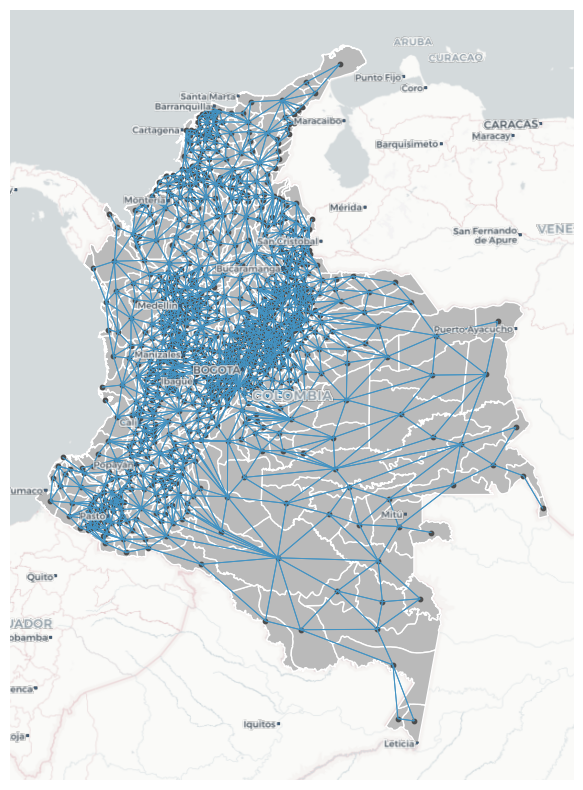

In [ ]:
# Plot the spatial weights using splot library
# This will visualize the spatial relationships between observations defined by the weights matrix W
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(14,10))
plot_spatial_weights(queen_weights, gdf, ax=ax)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source = cx.providers.CartoDB.Positron,           attribution=False)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source = cx.providers.CartoDB.PositronOnlyLabels, attribution=False)
plt.show()

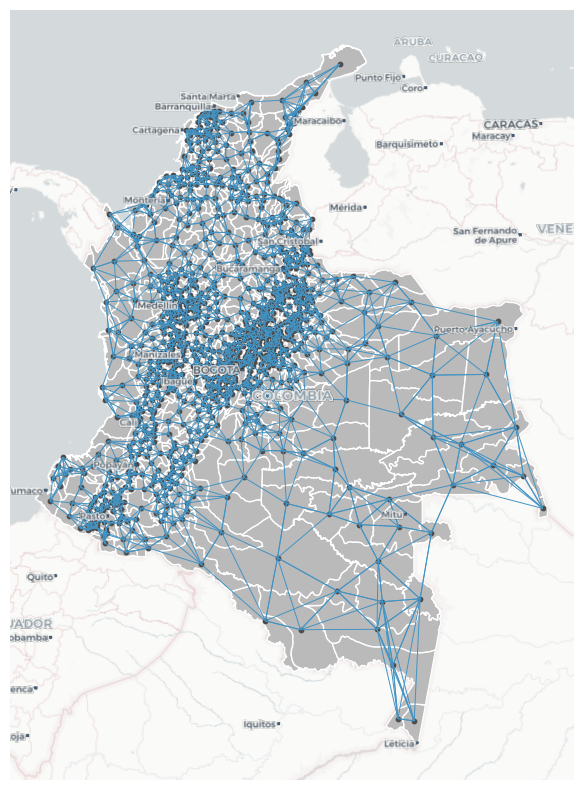

In [ ]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(14,10))
plot_spatial_weights(weights_KNN, gdf, ax=ax)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source = cx.providers.CartoDB.Positron,           attribution=False)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source = cx.providers.CartoDB.PositronOnlyLabels, attribution=False)
plt.show()

In [ ]:
#@title Export the weight matrix to cSV file

In [ ]:
# Convert object into a dense matrix

dense_matrix = queen_weights.sparse.toarray()

In [ ]:
# Create a data frame based on the dense matrix
df_weights = pd.DataFrame(dense_matrix, index=queen_weights.id_order, columns=queen_weights.id_order)

In [ ]:
df_weights.to_csv("/content/drive/MyDrive/Earthengine/BBDD/weights_matrix.csv", index=True)

# Global spatial dependence

In [ ]:
# Compute Global Moran's I statistic for the 'PM2' variables using the spatial weights matrix W
globalMoran_2016 = Moran(gdf['PM2.5_2016'], weights_KNN)
globalMoran_2017 = Moran(gdf['PM2.5_2017'], weights_KNN)
globalMoran_2018 = Moran(gdf['PM2.5_2018'], weights_KNN)
globalMoran_2019 = Moran(gdf['PM2.5_2019'], weights_KNN)
globalMoran_2020 = Moran(gdf['PM2.5_2020'], weights_KNN)
globalMoran_2021 = Moran(gdf['PM2.5_2021'], weights_KNN)
globalMoran_2022 = Moran(gdf['PM2.5_2022'], weights_KNN)
# Format Moran's I statistic to two decimal places
moranI_2016 = "{:.2f}".format(globalMoran_2016.I)
moranI_2017 = "{:.2f}".format(globalMoran_2017.I)
moranI_2018 = "{:.2f}".format(globalMoran_2018.I)
moranI_2019 = "{:.2f}".format(globalMoran_2019.I)
moranI_2020 = "{:.2f}".format(globalMoran_2020.I)
moranI_2021 = "{:.2f}".format(globalMoran_2021.I)
moranI_2022 = "{:.2f}".format(globalMoran_2022.I)

# Print Moran's I statistic
print(moranI_2016, moranI_2017, moranI_2018, moranI_2019, moranI_2020, moranI_2021, moranI_2022)

0.92 0.90 0.90 0.90 0.91 0.90 0.90


In [ ]:
print(globalMoran_2016.p_sim)
print(globalMoran_2017.p_sim)
print(globalMoran_2018.p_sim)
print(globalMoran_2019.p_sim)
print(globalMoran_2020.p_sim)
print(globalMoran_2021.p_sim)
print(globalMoran_2022.p_sim)

0.001
0.001
0.001
0.001
0.001
0.001
0.001


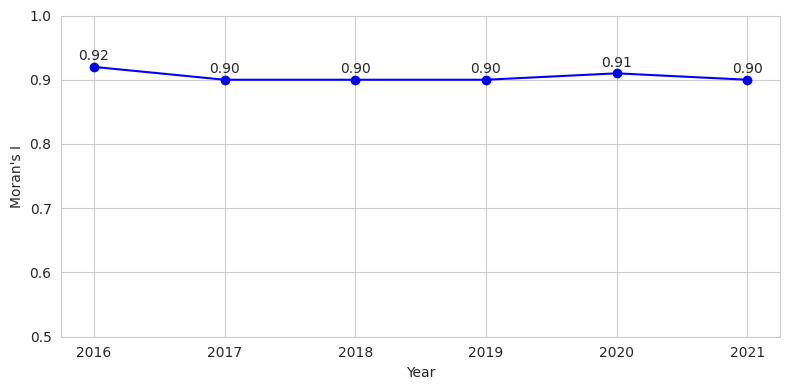

In [ ]:
# Datos
x = [2016, 2017, 2018, 2019, 2020, 2021]
y = [0.92, 0.90, 0.90, 0.90, 0.91, 0.90]

# Crear gráfico de líneas
plt.figure(figsize=(8, 4))
plt.plot(x, y, marker='o', color='blue', linestyle='-')


# Etiquetas de los ejes
plt.xlabel("Year")
plt.ylabel("Moran's I")

plt.ylim(0.5, 1)

# Agregar etiquetas a cada punto
for i, value in enumerate(y):
    plt.text(x[i], y[i] + 0.01, f"{value:.2f}", ha='center')


plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Calculate spatial lag of PM2.5_2016 using the specified weights
gdf['wimds_2016'] = weights.lag_spatial(weights_KNN, gdf['PM2.5_2016'])
gdf["wimds_2017"] = weights.lag_spatial(weights_KNN, gdf['PM2.5_2017'])
gdf["wimds_2018"] = weights.lag_spatial(weights_KNN, gdf['PM2.5_2018'])
gdf["wimds_2019"] = weights.lag_spatial(weights_KNN, gdf['PM2.5_2019'])
gdf["wimds_2020"] = weights.lag_spatial(weights_KNN, gdf['PM2.5_2020'])
gdf["wimds_2021"] = weights.lag_spatial(weights_KNN, gdf['PM2.5_2021'])
gdf["wimds_2022"] = weights.lag_spatial(weights_KNN, gdf['PM2.5_2022'])

# Local spatial dependence

In [ ]:
# Calculate Local Moran's I statistics
# gdf['PM2.5_2016'] is the variable for which local spatial autocorrelation is computed
# Queen_weights is the spatial weights matrix defining the spatial relationships between observations
# permutations specifies the number of random permutations for statistical inference
# seed sets the seed for reproducibility of random permutations
moranLocal_2016 = Moran_Local(gdf['PM2.5_2016'], weights_KNN, permutations=999, seed=12345)
moranLocal_2017 = Moran_Local(gdf['PM2.5_2017'], weights_KNN, permutations=999, seed=12345)
moranLocal_2018 = Moran_Local(gdf['PM2.5_2018'], weights_KNN, permutations=999, seed=12345)
moranLocal_2019 = Moran_Local(gdf['PM2.5_2019'], weights_KNN, permutations=999, seed=12345)
moranLocal_2020 = Moran_Local(gdf['PM2.5_2020'], weights_KNN, permutations=999, seed=12345)
moranLocal_2021 = Moran_Local(gdf['PM2.5_2021'], weights_KNN, permutations=999, seed=12345)
moranLocal_2022 = Moran_Local(gdf['PM2.5_2022'], weights_KNN, permutations=999, seed=12345)

In [ ]:
gdf['ADM2_NAME'] = gdf['ADM2_NAME'].replace('Santafe De Bogota D.c.', 'Bogota')
gdf['ADM2_NAME'] = gdf['ADM2_NAME'].replace('Cartagena (dist. Esp.)', 'Cartagena')
gdf['ADM2_NAME'] = gdf['ADM2_NAME'].replace("Barranquilla  (dist.port.", 'Barranquilla')

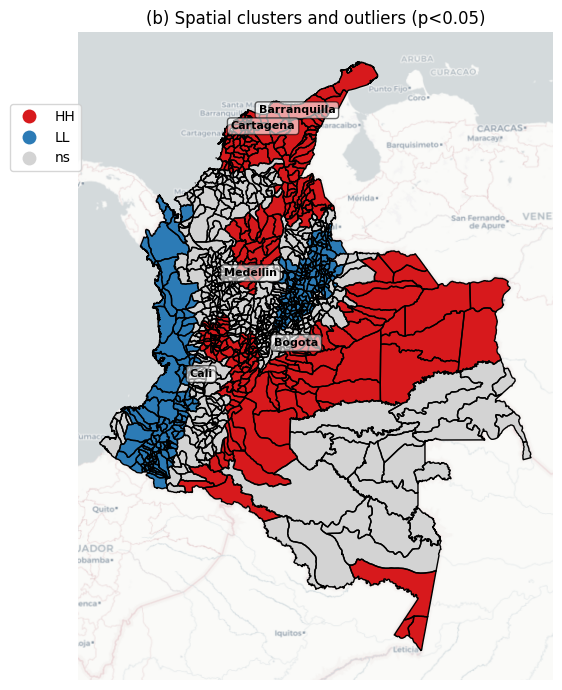

In [ ]:
# Adjust the aspect ratio for better readability
# Create a subplot with one plot
f, ax = plt.subplots(1, figsize=(10, 7))

# Plot Local Indicators of Spatial Association (LISA) clusters
# moranLocal is a Moran_Local object containing local Moran statistics
# gdf is a GeoDataFrame containing spatial data
# p is the significance level for identifying clusters
# legend_kwds is a dictionary containing keyword arguments for the legend
lisa_cluster(moranLocal_2016, gdf, p=0.05, legend_kwds={'bbox_to_anchor':(0.02, 0.90)}, ax=ax)

# Plot the GeoDataFrame gdf with only the border (no filled polygons)
gdf.plot(facecolor='none', edgecolor='black', ax=ax)

# Add a basemap to the plot using the contextily package
# crs is the coordinate reference system of gdf
# source specifies the basemap provider (CartoDB.Voyager/CartoDB.Positron)
# attribution=False removes the attribution from the basemap
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Positron, attribution=False)

# Add a title to the plot for context
ax.set_title("(b) Spatial clusters and outliers (p<0.05)")

# Select the represetative municipalities
selected_municipios = gdf[gdf['ADM2_NAME'].isin(['Bogota', 'Medellin', 'Cali', "Cartagena", "Barranquilla"])]

# Compute the centroids
selected_municipios['centroid'] = selected_municipios.geometry.centroid

# Add the labels
for idx, row in selected_municipios.iterrows():
    ax.annotate(
        text=row['ADM2_NAME'],  # Nombre del municipio
        xy=(row['centroid'].x, row['centroid'].y),  # Coordenadas del centroide
        xytext=(3, 3),  # Desplazamiento del texto en píxeles
        textcoords='offset points',  # Coordenadas relativas al punto
        fontsize=8,  # Tamaño de la fuente
        color='black',  # Color del texto
        weight='bold',  # Grosor del texto
        bbox=dict(
            boxstyle="round,pad=0.3",  # Estilo del cuadro (redondeado con padding)
            fc="white",  # Color de fondo del cuadro
            ec="black",  # Color del borde del cuadro
            alpha=0.6  # Transparencia del cuadro (0 es totalmente transparente, 1 es opaco)
        ))
# Adjust layout to prevent clipping of titles and labels
plt.tight_layout()

# Save the plot as an image file with high DPI and tight bounding box
plt.savefig("lisaMAP.png", dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

In [ ]:
# Add local Moran's I p-values to the GeoDataFrame
gdf['lisa_2016'] = moranLocal_2016.p_sim
gdf['lisa_2017'] = moranLocal_2017.p_sim
gdf['lisa_2018'] = moranLocal_2018.p_sim
gdf['lisa_2019'] = moranLocal_2019.p_sim
gdf['lisa_2020'] = moranLocal_2020.p_sim
gdf['lisa_2021'] = moranLocal_2021.p_sim
gdf['lisa_2022'] = moranLocal_2022.p_sim

# Classify and assign cluster types based on significance levels
# If p-value is less than 0.05, assign cluster type based on quadrant (q)
gdf.loc[moranLocal_2016.p_sim < 0.05, 'cluster_2016'] = moranLocal_2016.q[moranLocal_2016.p_sim < 0.05]

# Fill NaN values with 0 (for non-significant observations)
gdf["cluster_2016"] = gdf["cluster_2016"].fillna(0)

# Map cluster codes to descriptive labels
gdf["cluster_2016"] = gdf["cluster_2016"].map({
    0: "Not significant",   # No significant spatial autocorrelation
    1: "High-high",         # High value surrounded by high values (hotspot)
    2: "Low-high",          # Low value surrounded by high values
    3: "Low-low",           # Low value surrounded by low values (coldspot)
    4: "High-low",          # High value surrounded by low values
})

In [ ]:
# Create a scatter plot using Plotly Express
fig = px.scatter(
    gdf,
    x='PM2.5_2016',                               # Data for the x-axis
    y= 'wimds_2016',                              # Data for the y-axis
    color='cluster',                        # Color points by cluster type
    color_discrete_sequence=["#d3d3d3", "#c23429", "#4679b1", "#b5d8e7", "#efb16e"],  # Define color sequence for clusters
    hover_name='ADM2_NAME',                       # Display municipality name in hover tooltip
    hover_data=['ADM2_NAME', 'cluster', 'PM2.5_2016', 'wimds_2016', 'lisa_2016'],  # Additional data for hover tooltip
    trendline="ols",                        # Add an ordinary least squares (OLS) trendline
    trendline_scope='overall'             # Fit a single trendline for all data points
)

# Set the color of the trendline to black
fig.update_traces(line=dict(color='black'))

# Set the range for x-axis and y-axis
x_range = [min(gdf['PM2.5_2016']), max(gdf['PM2.5_2016'])]
y_range = [min(gdf['wimds_2016']), max(gdf['wimds_2016'])]
fig.update_xaxes(range=x_range)
fig.update_yaxes(range=y_range)

# Add horizontal and vertical lines at the average values
average_imds_value = gdf['PM2.5_2016'].mean()
average_wimds_value = gdf['wimds_2016'].mean()

fig.add_shape(
    type="line",
    x0=average_imds_value,
    y0=y_range[0],
    x1=average_imds_value,
    y1=y_range[1],
    line=dict(color="grey", width=1, dash="dash")
)

fig.add_shape(
    type="line",
    x0=x_range[0],
    y0=average_wimds_value,
    x1=x_range[1],
    y1=average_wimds_value,
    line=dict(color="grey", width=1, dash="dash")
)

# Update layout to set plot background color to white
fig.update_layout(plot_bgcolor='#f9f9f7')

# Display the updated figure
fig.show()

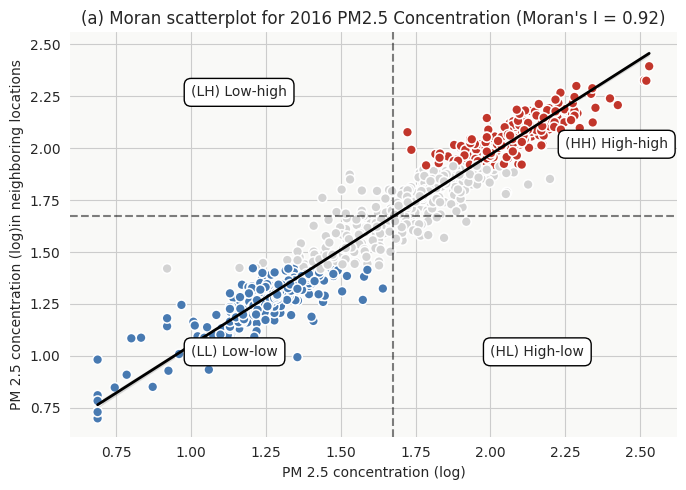

In [ ]:
# Set Seaborn theme to white grid for cleaner appearance
sns.set_style('whitegrid')

# Adjust the aspect ratio for better readability
f, ax = plt.subplots(1, figsize=(7, 5))

# Add the regression line with all grey points
sns.regplot(
    x='PM2.5_2016',
    y='wimds_2016',
    data=gdf,
    scatter=True,
    marker='.',
    color='#d3d3d3',                    # Light gray for points
    line_kws={'linewidth': 2, 'color': 'black'}  # Black for regression line
)

# Overlay the significant points
sns.scatterplot(
    x='PM2.5_2016',
    y="wimds_2016",
    hue="cluster_2016",
    palette= ["#d3d3d3", "#c23429", "#4679b1", "#b5d8e7", "#efb16e"],  # #c23429 (Red) #4679b1 (Blue), #b5d8e7 (Light blue), #efb16e(Orange), #d3d3d3 (Light grey)
    data=gdf,
    marker=".",
    s=200,  # Increase the marker size here
    alpha=0.99,  # No need for scatter_kws here
    legend=False  # Add this line to remove the legend
)

# Remove spines for a cleaner look
sns.despine(top=True, bottom=True, left=True, right=True)

# Add reference lines (average values)
plt.axvline(gdf['PM2.5_2016'].mean(), c='black', alpha=0.5, linestyle='--')
plt.axhline(gdf['wimds_2016'].mean(), c='black', alpha=0.5, linestyle='--')

# Annotate quadrants directly for clarity
ax.annotate('(HH) High-high', xy=(2.25, 2), xytext=(2.25, 2), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1))
ax.annotate('(HL) High-low', xy=(2, 1), xytext=(2, 1), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1))
ax.annotate('(LH) Low-high', xy=(1, 2.25), xytext=(1, 2.25), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1))
ax.annotate('(LL) Low-low', xy=(1, 1), xytext=(1, 1), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1))

# Add a title for context
ax.set_title(f"(a) Moran scatterplot for 2016 PM2.5 Concentration (Moran's I = {moranI_2016})")

# Create more informative labels
ax.set_xlabel('PM 2.5 concentration (log)')                 # Replace with the actual variable name
ax.set_ylabel('PM 2.5 concentration (log)in neighboring locations')   # Replace if applicable

# Set background color for the plot
ax.set_facecolor('#f9f9f7')

# Save and show the plot
plt.tight_layout()
plt.savefig('lisaSC.png', dpi=300, bbox_inches='tight')
plt.show()

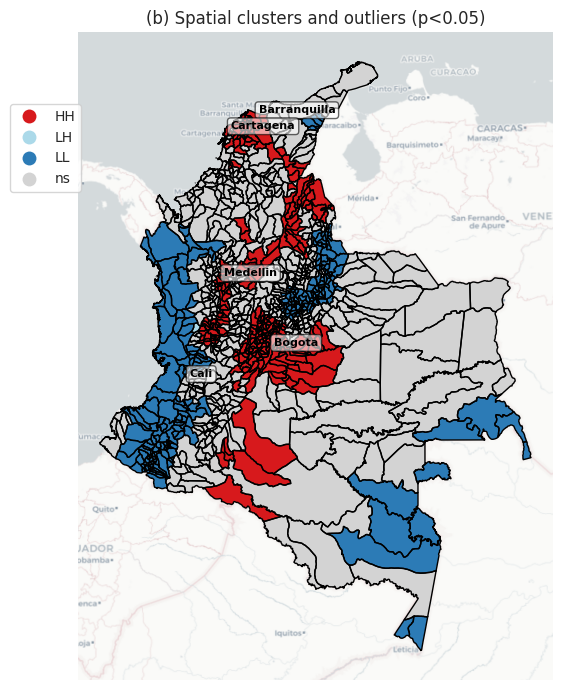

In [ ]:
# Adjust the aspect ratio for better readability
# Create a subplot with one plot
f, ax = plt.subplots(1, figsize=(10, 7))

# Plot Local Indicators of Spatial Association (LISA) clusters
# moranLocal is a Moran_Local object containing local Moran statistics
# gdf is a GeoDataFrame containing spatial data
# p is the significance level for identifying clusters
# legend_kwds is a dictionary containing keyword arguments for the legend
lisa_cluster(moranLocal_2021, gdf, p=0.05, legend_kwds={'bbox_to_anchor':(0.02, 0.90)}, ax=ax)

# Plot the GeoDataFrame gdf with only the border (no filled polygons)
gdf.plot(facecolor='none', edgecolor='black', ax=ax)

# Add a basemap to the plot using the contextily package
# crs is the coordinate reference system of gdf
# source specifies the basemap provider (CartoDB.Voyager/CartoDB.Positron)
# attribution=False removes the attribution from the basemap
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Positron, attribution=False)

# Add a title to the plot for context
ax.set_title("(b) Spatial clusters and outliers (p<0.05)")

# Select the represetative municipalities
selected_municipios = gdf[gdf['ADM2_NAME'].isin(['Bogota', 'Medellin', 'Cali', "Cartagena", "Barranquilla"])]

# Compute the centroids
selected_municipios['centroid'] = selected_municipios.geometry.centroid

# Add the labels
for idx, row in selected_municipios.iterrows():
    ax.annotate(
        text=row['ADM2_NAME'],  # Nombre del municipio
        xy=(row['centroid'].x, row['centroid'].y),  # Coordenadas del centroide
        xytext=(3, 3),  # Desplazamiento del texto en píxeles
        textcoords='offset points',  # Coordenadas relativas al punto
        fontsize=8,  # Tamaño de la fuente
        color='black',  # Color del texto
        weight='bold',  # Grosor del texto
        bbox=dict(
            boxstyle="round,pad=0.3",  # Estilo del cuadro (redondeado con padding)
            fc="white",  # Color de fondo del cuadro
            ec="black",  # Color del borde del cuadro
            alpha=0.6  # Transparencia del cuadro (0 es totalmente transparente, 1 es opaco)
        ))
# Adjust layout to prevent clipping of titles and labels
plt.tight_layout()

# Save the plot as an image file with high DPI and tight bounding box
plt.savefig("lisaMAP2.png", dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

In [ ]:
# Classify and assign cluster types based on significance levels
# If p-value is less than 0.05, assign cluster type based on quadrant (q)
gdf.loc[moranLocal_2021.p_sim < 0.05, 'cluster_2021'] = moranLocal_2021.q[moranLocal_2021.p_sim < 0.05]

# Fill NaN values with 0 (for non-significant observations)
gdf["cluster_2021"] = gdf["cluster_2021"].fillna(0)

# Map cluster codes to descriptive labels
gdf["cluster_2021"] = gdf["cluster_2021"].map({
    0: "Not significant",   # No significant spatial autocorrelation
    1: "High-high",         # High value surrounded by high values (hotspot)
    2: "Low-high",          # Low value surrounded by high values
    3: "Low-low",           # Low value surrounded by low values (coldspot)
    4: "High-low",          # High value surrounded by low values
})

In [ ]:
# Create a scatter plot using Plotly Express
fig = px.scatter(
    gdf,
    x='PM2.5_2021',                               # Data for the x-axis
    y= 'wimds_2021',                              # Data for the y-axis
    color='cluster_2021',                        # Color points by cluster type
    color_discrete_sequence=["#d3d3d3", "#4679b1", "#c23429", "#b5d8e7", "#efb16e"],  # Define color sequence for clusters
    hover_name='ADM2_NAME',                       # Display municipality name in hover tooltip
    hover_data=['ADM2_NAME', 'cluster', 'PM2.5_2021', 'wimds_2021', 'lisa_2021'],  # Additional data for hover tooltip
    trendline="ols",                        # Add an ordinary least squares (OLS) trendline
    trendline_scope='overall'             # Fit a single trendline for all data points
)

# Set the color of the trendline to black
fig.update_traces(line=dict(color='black'))

# Set the range for x-axis and y-axis
x_range = [min(gdf['PM2.5_2021']), max(gdf['PM2.5_2021'])]
y_range = [min(gdf['wimds_2021']), max(gdf['wimds_2021'])]
fig.update_xaxes(range=x_range)
fig.update_yaxes(range=y_range)

# Add horizontal and vertical lines at the average values
average_imds_value = gdf['PM2.5_2021'].mean()
average_wimds_value = gdf['wimds_2021'].mean()

fig.add_shape(
    type="line",
    x0=average_imds_value,
    y0=y_range[0],
    x1=average_imds_value,
    y1=y_range[1],
    line=dict(color="grey", width=1, dash="dash")
)

fig.add_shape(
    type="line",
    x0=x_range[0],
    y0=average_wimds_value,
    x1=x_range[1],
    y1=average_wimds_value,
    line=dict(color="grey", width=1, dash="dash")
)

# Update layout to set plot background color to white
fig.update_layout(plot_bgcolor='#f9f9f7')

# Display the updated figure
fig.show()

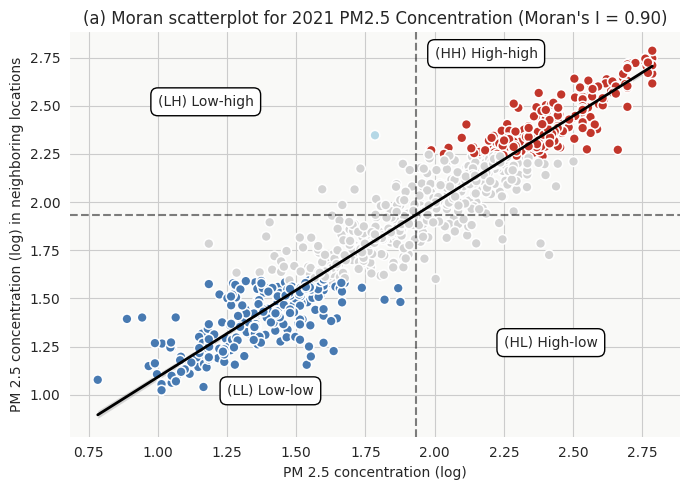

In [ ]:
# Set Seaborn theme to white grid for cleaner appearance
sns.set_style('whitegrid')

# Adjust the aspect ratio for better readability
f, ax = plt.subplots(1, figsize=(7, 5))

# Add the regression line with all grey points
sns.regplot(
    x='PM2.5_2021',
    y='wimds_2021',
    data=gdf,
    scatter=True,
    marker='.',
    color='#d3d3d3',                    # Light gray for points
    line_kws={'linewidth': 2, 'color': 'black'}  # Black for regression line
)

# Overlay the significant points
sns.scatterplot(
    x='PM2.5_2021',
    y="wimds_2021",
    hue="cluster_2021",
    palette= ["#d3d3d3", "#4679b1", "#c23429", "#b5d8e7", "#efb16e"],  # #c23429 (Red) #4679b1 (Blue), #b5d8e7 (Light blue), #efb16e(Orange), #d3d3d3 (Light grey)
    data=gdf,
    marker=".",
    s=200,  # Increase the marker size here
    alpha=0.99,  # No need for scatter_kws here
    legend=False  # Add this line to remove the legend
)

# Remove spines for a cleaner look
sns.despine(top=True, bottom=True, left=True, right=True)

# Add reference lines (average values)
plt.axvline(gdf['PM2.5_2021'].mean(), c='black', alpha=0.5, linestyle='--')
plt.axhline(gdf['wimds_2021'].mean(), c='black', alpha=0.5, linestyle='--')

# Annotate quadrants directly for clarity
ax.annotate('(HH) High-high', xy=(2, 2.75), xytext=(2, 2.75), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1))
ax.annotate('(HL) High-low', xy=(2.25, 1.25), xytext=(2.25, 1.25), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1))
ax.annotate('(LH) Low-high', xy=(1, 2.50), xytext=(1, 2.50), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1))
ax.annotate('(LL) Low-low', xy=(1.25, 1), xytext=(1.25, 1), fontsize=10,
            bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1))

# Add a title for context
ax.set_title(f"(a) Moran scatterplot for 2021 PM2.5 Concentration (Moran's I = {moranI_2021})")

# Create more informative labels
ax.set_xlabel('PM 2.5 concentration (log)')                 # Replace with the actual variable name
ax.set_ylabel('PM 2.5 concentration (log) in neighboring locations')   # Replace if applicable

# Set background color for the plot
ax.set_facecolor('#f9f9f7')

# Save and show the plot
plt.tight_layout()
plt.savefig('lisaSC2.png', dpi=300, bbox_inches='tight')
plt.show()

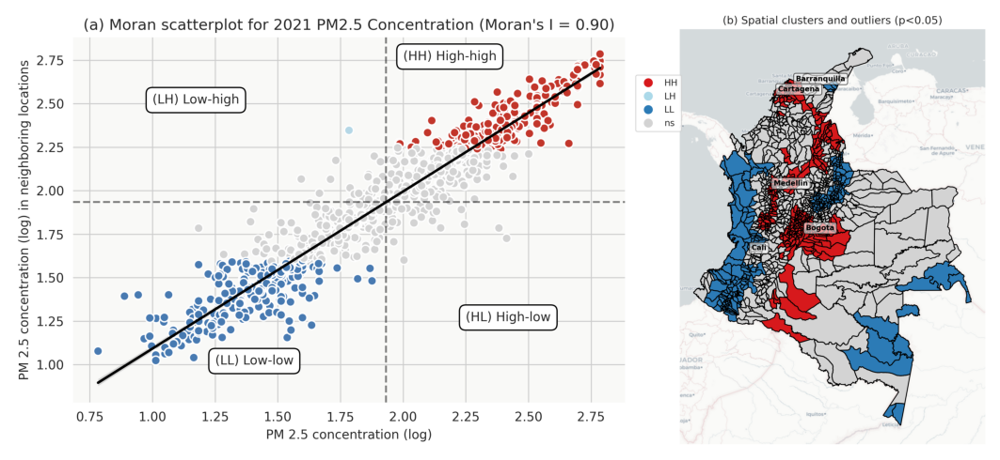

In [ ]:
# Combine figures

# Read the two PNG files
image1 = mpimg.imread('lisaSC2.png')
image2 = mpimg.imread('lisaMAP2.png')

# Create a figure and a 1x2 grid of subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Display the first image in the first subplot
ax1.imshow(image1)
ax1.axis('off')  # Turn off axis for cleaner appearance

# Display the second image in the second subplot
ax2.imshow(image2)
ax2.axis('off')  # Turn off axis for cleaner appearance

# Adjust the horizontal spacing between subplots
plt.subplots_adjust(wspace=-0.6)

# Save and show the combined figure
plt.tight_layout()  # Ensure tight layout
plt.savefig('lisa2.png', dpi=300, bbox_inches='tight')  # Save the figure as PNG
plt.show()  # Display the combined figure

# Combined figures

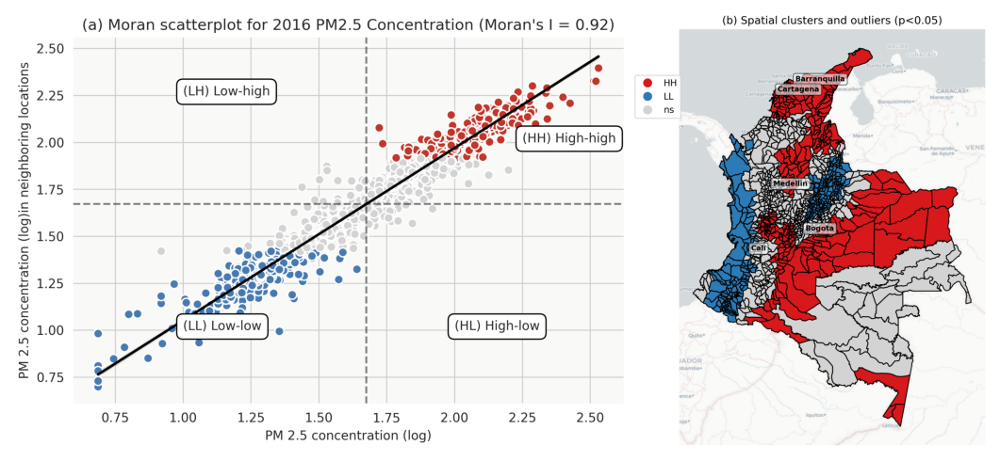

In [ ]:
# Combine figures

# Read the two PNG files
image1 = mpimg.imread('lisaSC.png')
image2 = mpimg.imread('lisaMAP.png')

# Create a figure and a 1x2 grid of subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Display the first image in the first subplot
ax1.imshow(image1)
ax1.axis('off')  # Turn off axis for cleaner appearance

# Display the second image in the second subplot
ax2.imshow(image2)
ax2.axis('off')  # Turn off axis for cleaner appearance

# Adjust the horizontal spacing between subplots
plt.subplots_adjust(wspace=-0.6)

# Save and show the combined figure
plt.tight_layout()  # Ensure tight layout
plt.savefig('lisa.png', dpi=300, bbox_inches='tight')  # Save the figure as PNG
plt.show()  # Display the combined figure

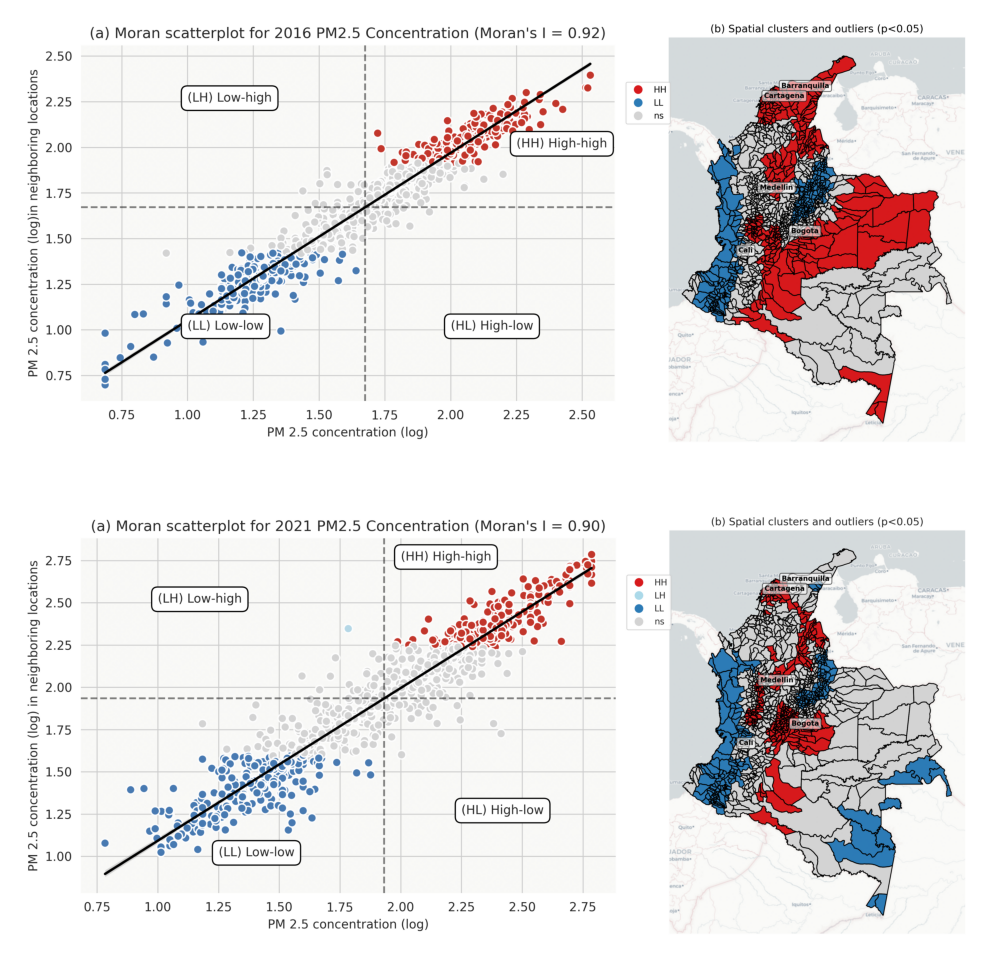

In [ ]:
# Combine figures

# Read the two PNG files
image1 = mpimg.imread('lisa.png')
image2 = mpimg.imread('lisa2.png')

# Create a figure and a 1x2 grid of subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Display the first image in the first subplot
ax1.imshow(image1)
ax1.axis('off')  # Turn off axis for cleaner appearance

# Display the second image in the second subplot
ax2.imshow(image2)
ax2.axis('off')  # Turn off axis for cleaner appearance

# Adjust the horizontal spacing between subplots
plt.subplots_adjust(wspace=-0.6)

# Save and show the combined figure
plt.tight_layout()  # Ensure tight layout
plt.savefig('lisa_2016_2021.png', dpi=300, bbox_inches='tight')  # Save the figure as PNG
plt.show()  # Display the combined figure

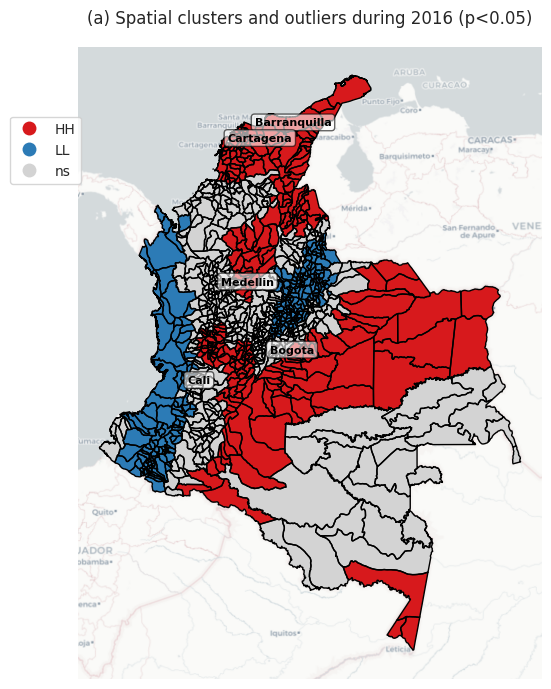

In [ ]:
# @title What happen with the clusters in the other years
# Adjust the aspect ratio for better readability
# Create a subplot with one plot
f, ax = plt.subplots(1, figsize=(10, 7))

# Plot Local Indicators of Spatial Association (LISA) clusters
# moranLocal is a Moran_Local object containing local Moran statistics
# gdf is a GeoDataFrame containing spatial data
# p is the significance level for identifying clusters
# legend_kwds is a dictionary containing keyword arguments for the legend
lisa_cluster(moranLocal_2016, gdf, p=0.05, legend_kwds={'bbox_to_anchor':(0.02, 0.90)}, ax=ax)

# Plot the GeoDataFrame gdf with only the border (no filled polygons)
gdf.plot(facecolor='none', edgecolor='black', ax=ax)

# Add a basemap to the plot using the contextily package
# crs is the coordinate reference system of gdf
# source specifies the basemap provider (CartoDB.Voyager/CartoDB.Positron)
# attribution=False removes the attribution from the basemap
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Positron, attribution=False)

# Add a title to the plot for context
ax.set_title("(a) Spatial clusters and outliers during 2016 (p<0.05)")

# Select the represetative municipalities
selected_municipios = gdf[gdf['ADM2_NAME'].isin(['Bogota', 'Medellin', 'Cali', "Cartagena", "Barranquilla"])]

# Compute the centroids
selected_municipios['centroid'] = selected_municipios.geometry.centroid

# Add the labels
for idx, row in selected_municipios.iterrows():
    ax.annotate(
        text=row['ADM2_NAME'],  # Nombre del municipio
        xy=(row['centroid'].x, row['centroid'].y),  # Coordenadas del centroide
        xytext=(3, 3),  # Desplazamiento del texto en píxeles
        textcoords='offset points',  # Coordenadas relativas al punto
        fontsize=8,  # Tamaño de la fuente
        color='black',  # Color del texto
        weight='bold',  # Grosor del texto
        bbox=dict(
            boxstyle="round,pad=0.3",  # Estilo del cuadro (redondeado con padding)
            fc="white",  # Color de fondo del cuadro
            ec="black",  # Color del borde del cuadro
            alpha=0.6  # Transparencia del cuadro (0 es totalmente transparente, 1 es opaco)
        ))
# Adjust layout to prevent clipping of titles and labels
plt.tight_layout()

# Save the plot as an image file with high DPI and tight bounding box
plt.savefig("lisaMAP_2016.png", dpi=300, bbox_inches='tight')

# Display the plot
plt.show()


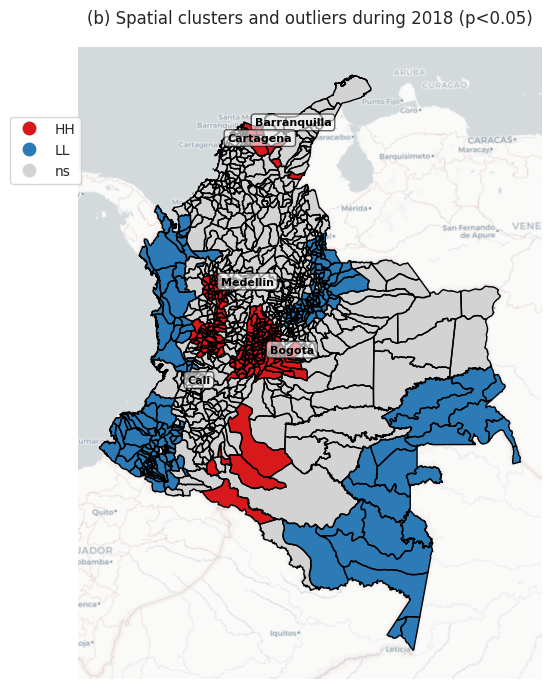

In [ ]:
# Adjust the aspect ratio for better readability
# Create a subplot with one plot
f, ax = plt.subplots(1, figsize=(10, 7))

# Plot Local Indicators of Spatial Association (LISA) clusters
# moranLocal is a Moran_Local object containing local Moran statistics
# gdf is a GeoDataFrame containing spatial data
# p is the significance level for identifying clusters
# legend_kwds is a dictionary containing keyword arguments for the legend
lisa_cluster(moranLocal_2018, gdf, p=0.05, legend_kwds={'bbox_to_anchor':(0.02, 0.90)}, ax=ax)

# Plot the GeoDataFrame gdf with only the border (no filled polygons)
gdf.plot(facecolor='none', edgecolor='black', ax=ax)

# Add a basemap to the plot using the contextily package
# crs is the coordinate reference system of gdf
# source specifies the basemap provider (CartoDB.Voyager/CartoDB.Positron)
# attribution=False removes the attribution from the basemap
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Positron, attribution=False)

# Add a title to the plot for context
ax.set_title("(b) Spatial clusters and outliers during 2018 (p<0.05)")

# Select the represetative municipalities
selected_municipios = gdf[gdf['ADM2_NAME'].isin(['Bogota', 'Medellin', 'Cali', "Cartagena", "Barranquilla"])]

# Compute the centroids
selected_municipios['centroid'] = selected_municipios.geometry.centroid

# Add the labels
for idx, row in selected_municipios.iterrows():
    ax.annotate(
        text=row['ADM2_NAME'],  # Nombre del municipio
        xy=(row['centroid'].x, row['centroid'].y),  # Coordenadas del centroide
        xytext=(3, 3),  # Desplazamiento del texto en píxeles
        textcoords='offset points',  # Coordenadas relativas al punto
        fontsize=8,  # Tamaño de la fuente
        color='black',  # Color del texto
        weight='bold',  # Grosor del texto
        bbox=dict(
            boxstyle="round,pad=0.3",  # Estilo del cuadro (redondeado con padding)
            fc="white",  # Color de fondo del cuadro
            ec="black",  # Color del borde del cuadro
            alpha=0.6  # Transparencia del cuadro (0 es totalmente transparente, 1 es opaco)
        ))
# Adjust layout to prevent clipping of titles and labels
plt.tight_layout()

# Save the plot as an image file with high DPI and tight bounding box
plt.savefig("lisaMAP_2018.png", dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

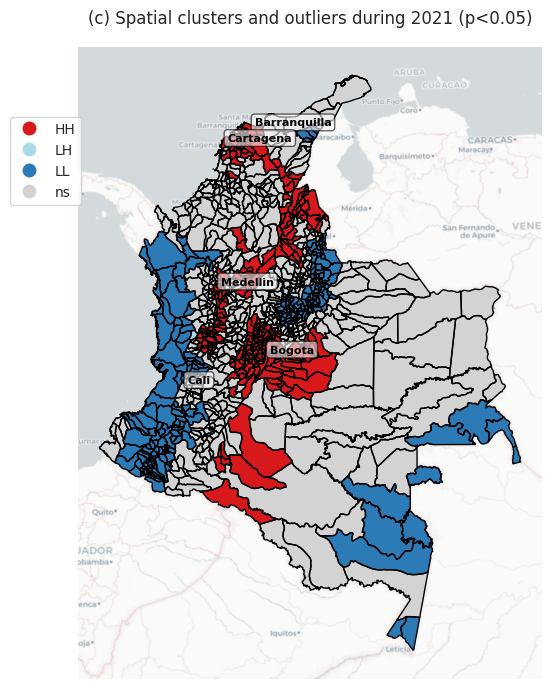

In [ ]:
# Adjust the aspect ratio for better readability
# Create a subplot with one plot
f, ax = plt.subplots(1, figsize=(10, 7))

# Plot Local Indicators of Spatial Association (LISA) clusters
# moranLocal is a Moran_Local object containing local Moran statistics
# gdf is a GeoDataFrame containing spatial data
# p is the significance level for identifying clusters
# legend_kwds is a dictionary containing keyword arguments for the legend
lisa_cluster(moranLocal_2021, gdf, p=0.05, legend_kwds={'bbox_to_anchor':(0.02, 0.90)}, ax=ax)

# Plot the GeoDataFrame gdf with only the border (no filled polygons)
gdf.plot(facecolor='none', edgecolor='black', ax=ax)

# Add a basemap to the plot using the contextily package
# crs is the coordinate reference system of gdf
# source specifies the basemap provider (CartoDB.Voyager/CartoDB.Positron)
# attribution=False removes the attribution from the basemap
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Positron, attribution=False)

# Add a title to the plot for context
ax.set_title("(c) Spatial clusters and outliers during 2021 (p<0.05)")

# Select the represetative municipalities
selected_municipios = gdf[gdf['ADM2_NAME'].isin(['Bogota', 'Medellin', 'Cali', "Cartagena", "Barranquilla"])]

# Compute the centroids
selected_municipios['centroid'] = selected_municipios.geometry.centroid

# Add the labels
for idx, row in selected_municipios.iterrows():
    ax.annotate(
        text=row['ADM2_NAME'],  # Nombre del municipio
        xy=(row['centroid'].x, row['centroid'].y),  # Coordenadas del centroide
        xytext=(3, 3),  # Desplazamiento del texto en píxeles
        textcoords='offset points',  # Coordenadas relativas al punto
        fontsize=8,  # Tamaño de la fuente
        color='black',  # Color del texto
        weight='bold',  # Grosor del texto
        bbox=dict(
            boxstyle="round,pad=0.3",  # Estilo del cuadro (redondeado con padding)
            fc="white",  # Color de fondo del cuadro
            ec="black",  # Color del borde del cuadro
            alpha=0.6  # Transparencia del cuadro (0 es totalmente transparente, 1 es opaco)
        ))
# Adjust layout to prevent clipping of titles and labels
plt.tight_layout()

# Save the plot as an image file with high DPI and tight bounding box
plt.savefig("lisaMAP_2021.png", dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

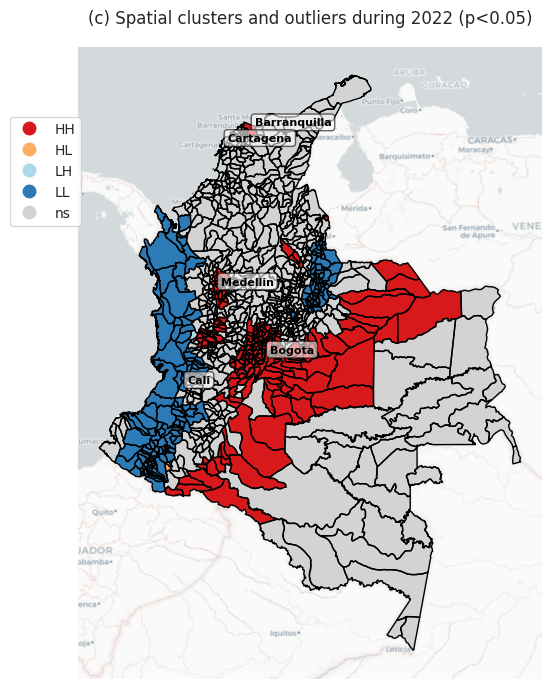

In [ ]:
# Adjust the aspect ratio for better readability
# Create a subplot with one plot
f, ax = plt.subplots(1, figsize=(10, 7))

# Plot Local Indicators of Spatial Association (LISA) clusters
# moranLocal is a Moran_Local object containing local Moran statistics
# gdf is a GeoDataFrame containing spatial data
# p is the significance level for identifying clusters
# legend_kwds is a dictionary containing keyword arguments for the legend
lisa_cluster(moranLocal_2022, gdf, p=0.05, legend_kwds={'bbox_to_anchor':(0.02, 0.90)}, ax=ax)

# Plot the GeoDataFrame gdf with only the border (no filled polygons)
gdf.plot(facecolor='none', edgecolor='black', ax=ax)

# Add a basemap to the plot using the contextily package
# crs is the coordinate reference system of gdf
# source specifies the basemap provider (CartoDB.Voyager/CartoDB.Positron)
# attribution=False removes the attribution from the basemap
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Positron, attribution=False)

# Add a title to the plot for context
ax.set_title("(c) Spatial clusters and outliers during 2022 (p<0.05)")

# Select the represetative municipalities
selected_municipios = gdf[gdf['ADM2_NAME'].isin(['Bogota', 'Medellin', 'Cali', "Cartagena", "Barranquilla"])]

# Compute the centroids
selected_municipios['centroid'] = selected_municipios.geometry.centroid

# Add the labels
for idx, row in selected_municipios.iterrows():
    ax.annotate(
        text=row['ADM2_NAME'],  # Nombre del municipio
        xy=(row['centroid'].x, row['centroid'].y),  # Coordenadas del centroide
        xytext=(3, 3),  # Desplazamiento del texto en píxeles
        textcoords='offset points',  # Coordenadas relativas al punto
        fontsize=8,  # Tamaño de la fuente
        color='black',  # Color del texto
        weight='bold',  # Grosor del texto
        bbox=dict(
            boxstyle="round,pad=0.3",  # Estilo del cuadro (redondeado con padding)
            fc="white",  # Color de fondo del cuadro
            ec="black",  # Color del borde del cuadro
            alpha=0.6  # Transparencia del cuadro (0 es totalmente transparente, 1 es opaco)
        ))
# Adjust layout to prevent clipping of titles and labels
plt.tight_layout()

# Save the plot as an image file with high DPI and tight bounding box
plt.savefig("lisaMAP_2022.png", dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

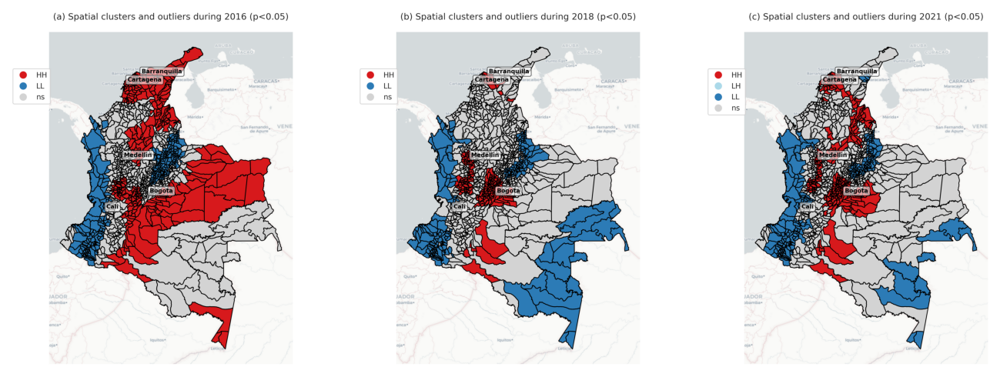

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec

# Leer las imágenes
image1 = mpimg.imread('lisaMAP_2016.png')
image2 = mpimg.imread('lisaMAP_2018.png')
image3 = mpimg.imread('lisaMAP_2021.png')

# Create a figure and a 1x3 grid of subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, 5))

# Display the first image in the first subplot
ax1.imshow(image1)
ax1.axis('off')  # Turn off axis for cleaner appearance

# Display the second image in the second subplot
ax2.imshow(image2)
ax2.axis('off')  # Turn off axis for cleaner appearance

# Display the third image in the third subplot
ax3.imshow(image3)
ax3.axis('off')  # Turn off axis for cleaner appearance

# Adjust the horizontal spacing between subplots
plt.subplots_adjust(wspace=0.1)

# Save and show the combined figure
plt.tight_layout()  # Ensure tight layout
plt.savefig('cluster_comparation.png', dpi=300, bbox_inches='tight')  # Save the figure as PNG
plt.show()  # Display the combined figure